<a href="https://colab.research.google.com/github/ytg32/tekno2021-object-detection/blob/main/video2n_image_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

In [ ]:
import torch
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [5]:
from detectron2.data.datasets import register_coco_instances

In [6]:
register_coco_instances("trainDS", {}, "/content/drive/MyDrive/dataset1000/train.json", "/content/drive/MyDrive/dataset1000/train")

In [7]:
metadata = MetadataCatalog.get("trainDS")

In [8]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml'))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4 # Set threshold for this model
cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/COCO/output/model_final.pth' # Set path model .pth
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6
predictor = DefaultPredictor(cfg)

In [ ]:
dataset_dicts = DatasetCatalog.get("trainDS")

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 1):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=1.25, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [11]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
import numpy as np
import cv2

In [12]:
video_path = '/content/drive/MyDrive/data-yolov5/videos/deathCircle/video2/video.mov'

In [13]:
video = cv2.VideoCapture(video_path)
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

In [14]:
def video2imagePreds(video, maxFrames):
    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            print('No Frame Left')
            break
        outputs = predictor(frame)

        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        v = Visualizer(frame[:, :, ::-1],
                   metadata=metadata, 
                   scale=1.25, 
                   instance_mode=ColorMode.IMAGE_BW 
        )
        v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(v.get_image()[:, :, ::-1])

        readFrames += 1
        if maxFrames != -1 and readFrames > maxFrames:
            print('Max Frame Limit!')
            break

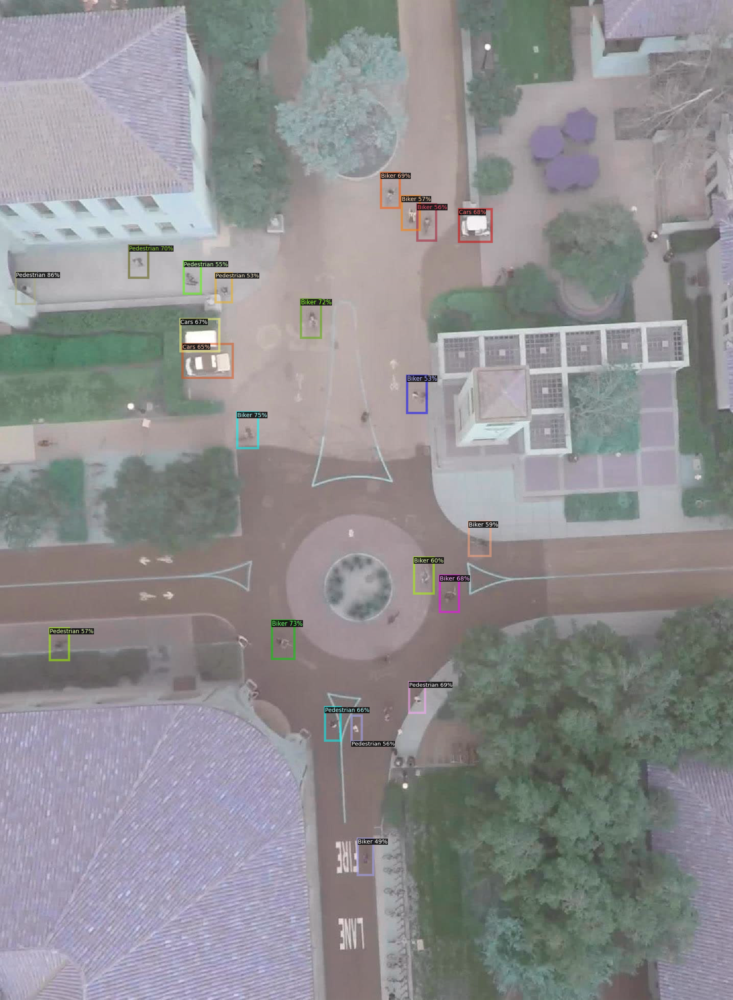

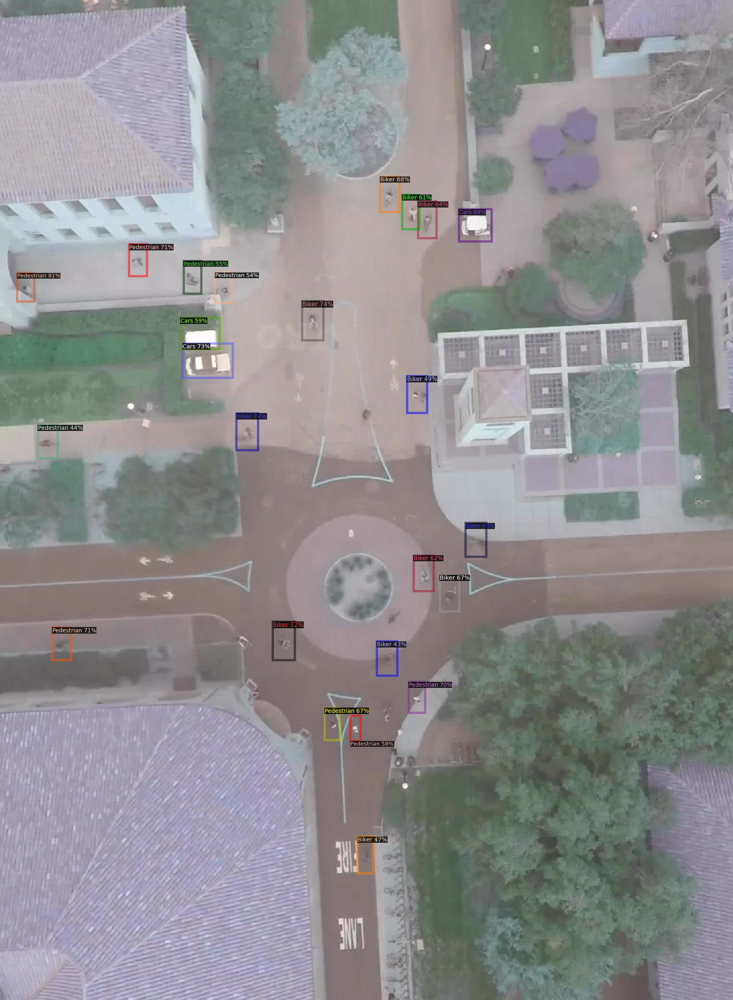

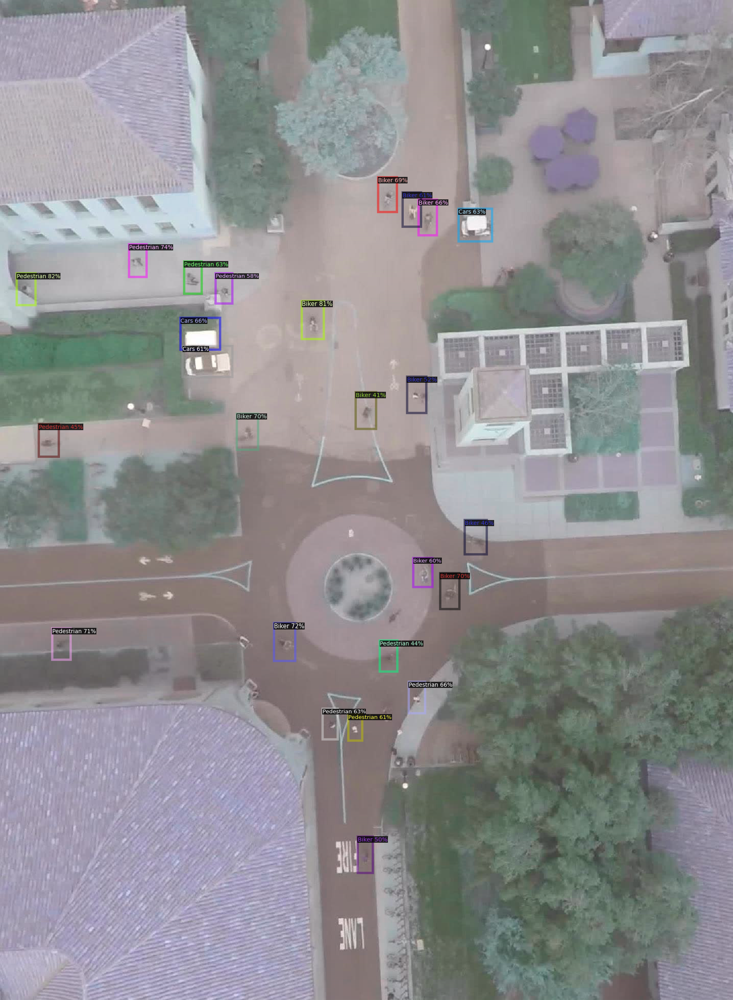

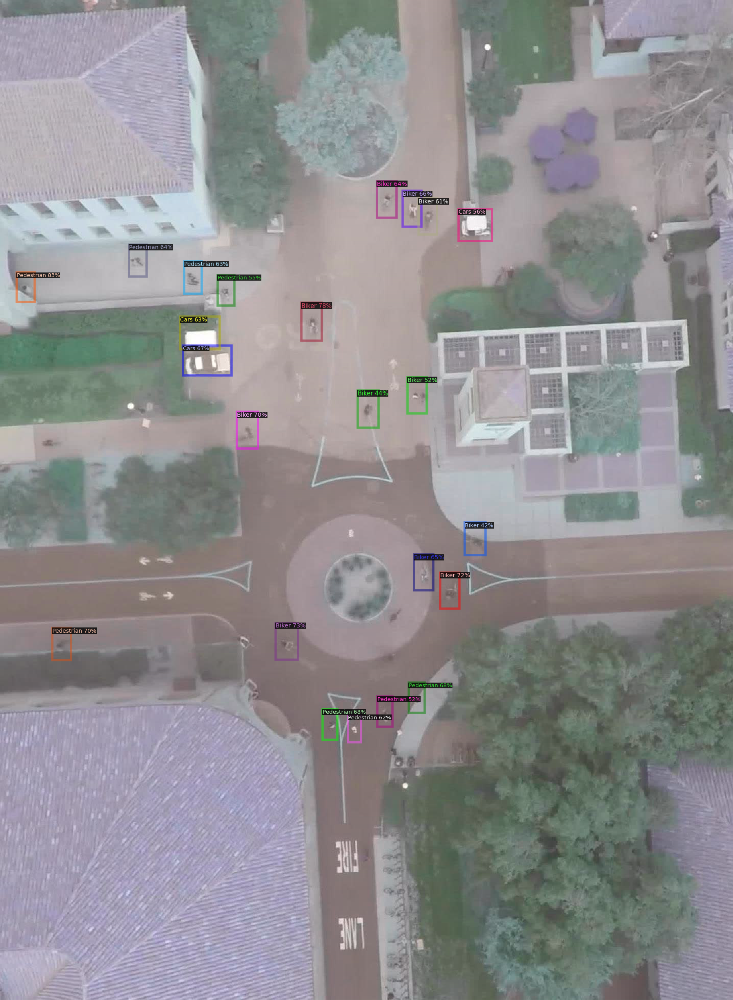

Max Frame Limit!


In [15]:
img_num = 3
video2imagePreds(video, img_num)